<a href="https://colab.research.google.com/github/dubidub/THE-REPRESENTATION-AND-MEASUREMENTS-OF-URBAN-TRANSPORTATION-NETWORKS/blob/main/2_Assigning_weights_and_directions_to_the_network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Create the network of Taipei City

## GeoJSON of the villages

In [ ]:
from urllib.request import urlopen
import folium
import json
from geopy.geocoders import Nominatim 
from pandas.io.json import json_normalize

In [ ]:
# Load Taipei GeoJSON file
with urlopen('https://raw.githubusercontent.com/littlebtc/geodata4appy/master/simplified/taipei.geojson') as response:
    tp = json.load(response)

# Check on map 
address = 'Taipei'
geolocator = Nominatim(user_agent='tp_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

tp_map = folium.Map(location=[latitude, longitude], zoom_start=12)
folium.GeoJson(tp, name='geojson').add_to(tp_map)

tp_map

In [ ]:
# Check in dataframe
df_tp = json_normalize(tp['features'])

# Rename column names for later use
df_tp.rename(columns={'properties.TVNAME':'dist_neigh', 
                      'properties.PNAME':'city',
                      'properties.TNAME':'dist',
                      'properties.VNAME':'neigh'
                      }, 
             inplace=True)

df_tp = df_tp[['dist_neigh','geometry.coordinates']]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  


## Add nodes (centroids) and edges

### Find adjacent villages

In [ ]:
import pandas as pd

In [ ]:
# Remove duplicated coordinates in polygons of neighborhoods
df_tp['new_coordinates'] = None
new_coordinates = []
for i in range(len(df_tp)):
  coord = df_tp.loc[i,'geometry.coordinates'][0]
  new_coord = []
  for elem in coord:
    if elem not in new_coord:
      new_coord.append(elem)
  new_coordinates.append([new_coord])

df_tp['new_coordinates'] = pd.DataFrame(new_coordinates)

In [ ]:
# Find neighbors by looking for whether there are same coordinates between twwo polygons 
neighborhoods = []
for i in range(len(df_tp)):
  nei = []
  for j in range(len(df_tp)):
    match = 0
    for x in df_tp.loc[i,'new_coordinates']:
      for y in df_tp.loc[j,'new_coordinates']:  
        if y == x:
          match += 1
    # nei.append(match)
    if match >= 2 and j != i: # neighboring polygons must have share more than 1 coordinates to form a line
      nei.append(j)
  neighborhoods.append([nei])

df_tp['neighborhoods'] = None
df_tp['neighborhoods'] = pd.DataFrame(neighborhoods)
df_neighborhoods = df_tp[['dist_neigh','neighborhoods']]
df_neighborhoods

,dist_neigh,neighborhoods
0,松山區莊敬里,"[3, 4, 5, 8, 141, 143, 167, 327, 352]"
1,松山區東榮里,"[2, 7, 8]"
2,松山區三民里,"[1, 4, 6, 7, 8, 19]"
3,松山區新益里,"[0, 4, 5]"
4,松山區富錦里,"[0, 2, 3, 5, 6, 8]"
...,...,...
451,北投區關渡里,"[386, 431, 450]"
452,北投區泉源里,"[422, 439, 440, 442, 453, 454, 455]"
453,北投區湖山里,"[404, 408, 409, 422, 452, 455]"
454,北投區大屯里,"[442, 443, 445, 452, 455]"


### Add nodes

In [ ]:
from shapely.geometry import shape, Point
from folium import IFrame

In [ ]:
# Functions to find the centroid of a polygon in GeoJSON file
# Credited to brandonxiang/geojson-python-utils: https://github.com/brandonxiang/geojson-python-utils/blob/develop/README_CN.md

def centroid(poly):
    """
    get the centroid of polygon
    adapted from http://paulbourke.net/geometry/polyarea/javascript.txt
    Keyword arguments:
    poly -- polygon geojson object
    return polygon centroid
    """
    f_total = 0
    x_total = 0
    y_total = 0
    # TODO: polygon holes at coordinates[1]
    points = poly['coordinates'][0]
    j = len(points) - 1
    count = len(points)

    for i in range(0, count):
        p1_x = points[i][1]
        p1_y = points[i][0]
        p2_x = points[j][1]
        p2_y = points[j][0]

        f_total = p1_x * p2_y - p2_x * p1_y
        x_total += (p1_x + p2_x) * f_total
        y_total += (p1_y + p2_y) * f_total
        j = i

    six_area = area(poly) * 6
    return {'type': 'Point', 'coordinates': [y_total / six_area, x_total / six_area]}

def area(poly):
    """
    calculate the area of polygon
    Keyword arguments:
    poly -- polygon geojson object
    return polygon area
    """
    poly_area = 0
    # TODO: polygon holes at coordinates[1]
    points = poly['coordinates'][0]
    j = len(points) - 1
    count = len(points)

    for i in range(0, count):
        p1_x = points[i][1]
        p1_y = points[i][0]
        p2_x = points[j][1]
        p2_y = points[j][0]

        poly_area += p1_x * p2_y
        poly_area -= p1_y * p2_x
        j = i

    poly_area /= 2
    return poly_area

def add_centroid():
  paragraph = """<p>{}</p>""".format

  for lat, lng, dist_neigh in zip(df_tp['centroid_lat'], df_tp['centroid_lng'], df_tp['dist_neigh']):
    label = '{}'.format(dist_neigh)
    iframe = IFrame(html = paragraph(utf2asc(label)),
                width=100,
                height=50)
    popup = folium.Popup(iframe)
    folium.CircleMarker(
        [lat, lng],
        radius = 3,
        popup = popup,
        color = 'blue',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7,
        parse_html = False).add_to(map)  

  return map

def utf2asc(s): 
    return str(str(s).encode('ascii', 'xmlcharrefreplace'))[2:-1]

In [ ]:
# Find centroid of every neighborhood and add the laitudes and longitudes to new columns 
tp_lon = []
tp_lat = []
for i in range(456):
  box = tp['features'][i]['geometry']
  center = centroid(box)
  tp_lon.append(center['coordinates'][0])
  tp_lat.append(center['coordinates'][1])

df_tp['centroid_lat'] = tp_lat
df_tp['centroid_lng'] = tp_lon
df_neighborhoods = df_tp[['dist_neigh','neighborhoods', 'centroid_lat', 'centroid_lng']]
df_neighborhoods

,dist_neigh,neighborhoods,centroid_lat,centroid_lng
0,松山區莊敬里,"[3, 4, 5, 8, 141, 143, 167, 327, 352]",25.070698,121.563780
1,松山區東榮里,"[2, 7, 8]",25.060350,121.558050
2,松山區三民里,"[1, 4, 6, 7, 8, 19]",25.060024,121.562244
3,松山區新益里,"[0, 4, 5]",25.061795,121.567122
4,松山區富錦里,"[0, 2, 3, 5, 6, 8]",25.060958,121.564352
...,...,...,...,...
451,北投區關渡里,"[386, 431, 450]",25.117710,121.467772
452,北投區泉源里,"[422, 439, 440, 442, 453, 454, 455]",25.153236,121.520774
453,北投區湖山里,"[404, 408, 409, 422, 452, 455]",25.149328,121.539538
454,北投區大屯里,"[442, 443, 445, 452, 455]",25.160564,121.505817


### Add edges

In [ ]:
edges_centroid = []
for j in range(len(df_neighborhoods)):
  for i in range(len(df_neighborhoods.loc[j,'neighborhoods'])):
    edge = []
    des = df_neighborhoods.loc[j,'neighborhoods'][i]
    edge.append([df_neighborhoods.loc[j,'centroid_lat'], df_neighborhoods.loc[j,'centroid_lng']])
    edge.append([df_neighborhoods.loc[des,'centroid_lat'], df_neighborhoods.loc[des,'centroid_lng']])
    edges_centroid.append(edge)

In [ ]:
# add edges
map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)
add_centroid()
folium.PolyLine(edges_centroid,
  color='blue',
  weight=0.5,
  opacity=0.3).add_to(map)
map

# Nodes Weights: Population of Villages

## Load population data

In [ ]:
# Nodes weights: population
# Source: https://ca.gov.taipei/News_Content.aspx?n=8693DC9620A1AABF&sms=D19E9582624D83CB&s=78DC4B104D9D374E
ppl = pd.read_excel('https://github.com/dubidub/Coursera_Capstone/raw/master/Taipei%20Neighborhoods%20population%202019.xlsx')
ppl["dist_neigh"] = ppl["行政區"] + ppl["村里"]
ppl.rename(columns = {'總計': 'total_ppl'}, inplace=True)
ppl = ppl[['dist_neigh', 'total_ppl']]
ppl.loc[247, 'dist_neigh'] = '萬華區糖蔀里'
ppl

In [ ]:
ppl_456 = ppl.sort_values(by='total_ppl', ascending=False).iloc[13:]
ppl_456.describe()

,total_ppl
count,456.000000
mean,5800.528509
std,2049.630137
min,939.000000
25%,4429.250000
50%,5611.500000
75%,7123.500000
max,11836.000000


In [ ]:
# Add population data
df_neighborhoods = df_neighborhoods.merge(ppl, on='dist_neigh') # merge to get the office coordinates
df_neighborhoods

,dist_neigh,neighborhoods,centroid_lat,centroid_lng,total_ppl
0,松山區莊敬里,"[3, 4, 5, 8, 141, 143, 167, 327, 352]",25.070698,121.563780,5446
1,松山區東榮里,"[2, 7, 8]",25.060350,121.558050,8218
2,松山區三民里,"[1, 4, 6, 7, 8, 19]",25.060024,121.562244,6962
3,松山區新益里,"[0, 4, 5]",25.061795,121.567122,4679
4,松山區富錦里,"[0, 2, 3, 5, 6, 8]",25.060958,121.564352,5318
...,...,...,...,...,...
451,北投區關渡里,"[386, 431, 450]",25.117710,121.467772,11836
452,北投區泉源里,"[422, 439, 440, 442, 453, 454, 455]",25.153236,121.520774,2425
453,北投區湖山里,"[404, 408, 409, 422, 452, 455]",25.149328,121.539538,1660
454,北投區大屯里,"[442, 443, 445, 452, 455]",25.160564,121.505817,1277


## Normalize and draw on map

In [ ]:
# normalize total population for drawing on the map only
max_value = df_neighborhoods['total_ppl'].max()
min_value = df_neighborhoods['total_ppl'].min()
df_neighborhoods['total_norm'] = 1 + (df_neighborhoods['total_ppl'] - min_value) / (max_value - min_value) * 9
df_neighborhoods

In [ ]:
def ppl_map(centroid_or_office, edges, color):
  map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)

  # add edges
  # folium.PolyLine(edges,
  #   color=color,
  #   weight=0.5,
  #   opacity=0.5).add_to(map)

  # add nodes weighted by closeness centrality 
  paragraph = """<p>{}</p>""".format

  for lat, lng, dist_neigh, radius in zip(df_neighborhoods['{}_lat'.format(centroid_or_office)], df_neighborhoods['{}_lng'.format(centroid_or_office)], df_neighborhoods['dist_neigh'], df_neighborhoods['total_norm']):
    label = '{}'.format(dist_neigh)
    iframe = IFrame(html = paragraph(utf2asc(label)),
                width=100,
                height=50)
    popup = folium.Popup(iframe)
    folium.CircleMarker(
        [lat, lng],
        radius = radius,
        popup = popup,
        color = color,
        fill = True,
        fill_color = 'grey',
        fill_opacity = 0.5,
        parse_html = False).add_to(map)  

  return map

In [ ]:
ppl_map('centroid', edges_centroid, 'blue')

# Nodes Re-location: Village Offices' Coordinates

## The address of villages' offices

In [ ]:
!pip install odfpy
import urllib
import pandas as pd 

     |████████████████████████████████| 727kB 8.8MB/s 
  Created wheel for odfpy: filename=odfpy-1.4.1-py2.py3-none-any.whl size=160691 sha256=9d7085e1adf4607c1d5ce3232b4d5fad5d1f2ca985e1488b37dbe5f768de0d80
  Stored in directory: /root/.cache/pip/wheels/ce/6b/93/ec330f2991c5f1546abf640360e5a2022f76cb16e5d99ed2fd
Successfully built odfpy


In [ ]:
# read neighborhoods office address. source: https://ca.gov.taipei/News.aspx?n=14A5D56438607B72&sms=D8466F0C135796FC
urllib.request.urlretrieve(
    'https://www-ws.gov.taipei/Download.ashx?u=LzAwMS9VcGxvYWQvMzM0L3JlbGZpbGUvMTYxMTkvMjU1MDgwNS9kNjQ1ZjY3Yy0xMTQ3LTQwMjMtODYwZC1jYTU0NThhNDczODYub2Rz&n=56ysMTPlsYbph4zplbflkI3lhopWMzQoMTA5MTExMSkub2Rz&icon=.ods', 
    'address.ods'
    )

address = pd.read_excel('address.ods', engine='odf')
address.columns = address.iloc[0]
address = address.iloc[1:]

address = address.rename(columns={'區別': 'dist', 
                                  '里別': 'neigh',
                                  '里辦公處地址': 'address'
                                  })
address

,dist,neigh,姓名,里辦公處電話,手機,address
1,松山區,莊敬里,劉美鳳,27606793,0920309000,撫遠街369巷12號1樓
2,松山區,東榮里,鄭玉梅,27676931,0933902948,民生東路5段69巷3號1樓
3,松山區,三民里,謝翠鈴,27671370,0910380103,民生東路5段163-1號8樓
4,松山區,新益里,吳美貞,87877641,0936841566,富錦街581巷20號
5,松山區,富錦里,李煥中,27638234,0912546233,富錦街515號
...,...,...,...,...,...,...
452,北投區,中和里,黃景煌,28942200,0919210306,中和街365號
453,北投區,大屯里,張天恩,28911750,0985325333,復興三路521巷18號
454,北投區,智仁里,傅書淵,28965288,0933764271,杏林二路74巷3號
455,北投區,秀山里,陳壽彭,28941666,0937022555,中和街502巷2弄15號


In [ ]:
address["dist_neigh"] = address["dist"] + address["neigh"]
address["address_new"] = '台北市' + address["address"]
address['address_new'] = address['address_new'].str.replace(" ","+")

In [ ]:
# Find duplicates
address[address['address_new'].duplicated()==True]

,dist,neigh,姓名,里辦公處電話,手機,address,dist_neigh,address_new
403,士林區,天山里,陳永鴻,28723220,0919318119,中山北路7段154巷6號4樓(天母區民活動中心),士林區天山里,台北市中山北路7段154巷6號4樓(天母區民活動中心)


In [ ]:
# Two neighborhoods share the same office 
address[address['address_new']=='台北市中山北路7段154巷6號4樓(天母區民活動中心)']

,dist,neigh,姓名,里辦公處電話,手機,address,dist_neigh,address_new
402,士林區,天和里,莊福來,28769333,0937186515,中山北路7段154巷6號4樓(天母區民活動中心),士林區天和里,台北市中山北路7段154巷6號4樓(天母區民活動中心)
403,士林區,天山里,陳永鴻,28723220,0919318119,中山北路7段154巷6號4樓(天母區民活動中心),士林區天山里,台北市中山北路7段154巷6號4樓(天母區民活動中心)


## Using Google Maps API to get the coordinates of offices

In [ ]:
import requests 

In [ ]:
# Find coordinates for 456 neighborhoods offices with addresses using Google Maps API
API_KEY = 'API_KEY'
office_list = []

for addr in address['address_new']:
  url = 'https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}'.format(
    addr,
    API_KEY
  )
  # print(url)
  results = requests.get(url).json()
  if len(results['results']) > 0: # in case google search returns null results, which it does
    office_list.append([
      addr,
      results['results'][0]['formatted_address'],
      results['results'][0]['geometry']['location']['lat'],
      results['results'][0]['geometry']['location']['lng']
    ])

In [ ]:
office_address = pd.DataFrame(office_list,
  columns=['address', 'formatted_address', 'v_latitude', 'v_longitude'])

neigh_off_addr = pd.merge(office_address, address, left_on = 'address', right_on='address_new', how='outer')
neigh_off_addr = neigh_off_addr[['dist_neigh', 'address_x', 'formatted_address', 'v_latitude', 'v_longitude']]
neigh_off_addr.rename(columns = { 'address_x': 'office_address', 
                                  'v_latitude': 'office_lat',
                                  'v_longitude': 'office_lng' }, 
                      inplace = True)
neigh_off_addr

,dist_neigh,office_address,formatted_address,office_lat,office_lng
0,松山區莊敬里,台北市撫遠街369巷12號1樓,"1, No. 12, Lane 369, Fuyuan Street, Songshan D...",25.064089,121.566617
1,松山區東榮里,台北市民生東路5段69巷3號1樓,"1, No. 3, Lane 69, Section 5, Minsheng East Ro...",25.059085,121.558110
2,松山區三民里,台北市民生東路5段163-1號8樓,"8, No. 163-1, Section 5, Minsheng East Road, S...",25.059315,121.562908
3,松山區新益里,台北市富錦街581巷20號,"No. 20-3, Lane 581, Fujin Street, Songshan Dis...",25.062881,121.566381
4,松山區富錦里,台北市富錦街515號,"No. 515-2, Fujin Street, Songshan District, Ta...",25.061199,121.564618
...,...,...,...,...,...
453,北投區大屯里,台北市復興三路521巷18號,"No. 18, Lane 521, Fuxingsan Road, Beitou Distr...",25.159716,121.499910
454,北投區智仁里,台北市杏林二路74巷3號,"No. 3, Lane 74, Xingliner Road, Beitou Distric...",25.142925,121.495911
455,北投區秀山里,台北市中和街502巷2弄15號,"No. 15, Alley 2, Lane 502, Zhonghe Street, Bei...",25.145584,121.494942
456,北投區文化里,台北市文化三路55號1樓,"1, No. 55, Wenhua 3rd Road, Beitou District, T...",25.139233,121.498064


In [ ]:
# There are 458 rows, meaning that except one row missing value, there are the other 2 additional rows 
# First find the missing value 
address[address['dist_neigh']=='松山區吉仁里']

,dist,neigh,姓名,里辦公處電話,手機,address,dist_neigh,address_new
28,松山區,吉仁里,李全長,25789589,0977252805,八德路3段76號3樓之2(中崙市場區民活動中心),松山區吉仁里,台北市八德路3段76號3樓之2(中崙市場區民活動中心)


In [ ]:
missing_addr = []
url = 'https://maps.googleapis.com/maps/api/geocode/json?address={}&key={}'.format(
  '台北市八德路3段76號',
  API_KEY
)
# print(url)
results = requests.get(url).json()
if len(results['results']) > 0:
  missing_addr.append([ '台北市八德路3段76號',
                        results['results'][0]['formatted_address'],
                        results['results'][0]['geometry']['location']['lat'],
                        results['results'][0]['geometry']['location']['lng'] ])
  
missing_addr[0].insert(0, '松山區吉仁里')
missing_row = pd.DataFrame(missing_addr, columns=['dist_neigh', 'office_address', 'formatted_address', 'office_lat', 'office_lng'])

neigh_off_addr = pd.concat([neigh_off_addr, missing_row], ignore_index=True)
neigh_off_addr.drop([457], inplace=True)
neigh_off_addr

,dist_neigh,office_address,formatted_address,office_lat,office_lng
0,松山區莊敬里,台北市撫遠街369巷12號1樓,"1, No. 12, Lane 369, Fuyuan Street, Songshan D...",25.064089,121.566617
1,松山區東榮里,台北市民生東路5段69巷3號1樓,"1, No. 3, Lane 69, Section 5, Minsheng East Ro...",25.059085,121.558110
2,松山區三民里,台北市民生東路5段163-1號8樓,"8, No. 163-1, Section 5, Minsheng East Road, S...",25.059315,121.562908
3,松山區新益里,台北市富錦街581巷20號,"No. 20-3, Lane 581, Fujin Street, Songshan Dis...",25.062881,121.566381
4,松山區富錦里,台北市富錦街515號,"No. 515-2, Fujin Street, Songshan District, Ta...",25.061199,121.564618
...,...,...,...,...,...
453,北投區大屯里,台北市復興三路521巷18號,"No. 18, Lane 521, Fuxingsan Road, Beitou Distr...",25.159716,121.499910
454,北投區智仁里,台北市杏林二路74巷3號,"No. 3, Lane 74, Xingliner Road, Beitou Distric...",25.142925,121.495911
455,北投區秀山里,台北市中和街502巷2弄15號,"No. 15, Alley 2, Lane 502, Zhonghe Street, Bei...",25.145584,121.494942
456,北投區文化里,台北市文化三路55號1樓,"1, No. 55, Wenhua 3rd Road, Beitou District, T...",25.139233,121.498064


In [ ]:
# Find duplicates: since merge on address (instead of name of neiighborhoods, there are duplicates)
neigh_off_addr[neigh_off_addr['dist_neigh'].duplicated()==True]

,dist_neigh,office_address,formatted_address,office_lat,office_lng
402,士林區天和里,台北市中山北路7段154巷6號4樓(天母區民活動中心),"號 4 樓, No. 6中山北路七段154巷士林區台北市 Taiwan 111",25.123956,121.533102
403,士林區天山里,台北市中山北路7段154巷6號4樓(天母區民活動中心),"號 4 樓, No. 6中山北路七段154巷士林區台北市 Taiwan 111",25.123956,121.533102


In [ ]:
neigh_off_addr.drop([402,403], inplace=True)
neigh_off_addr.reset_index(inplace=True)
neigh_off_addr

,index,dist_neigh,office_address,formatted_address,office_lat,office_lng
0,0,松山區莊敬里,台北市撫遠街369巷12號1樓,"1, No. 12, Lane 369, Fuyuan Street, Songshan D...",25.064089,121.566617
1,1,松山區東榮里,台北市民生東路5段69巷3號1樓,"1, No. 3, Lane 69, Section 5, Minsheng East Ro...",25.059085,121.558110
2,2,松山區三民里,台北市民生東路5段163-1號8樓,"8, No. 163-1, Section 5, Minsheng East Road, S...",25.059315,121.562908
3,3,松山區新益里,台北市富錦街581巷20號,"No. 20-3, Lane 581, Fujin Street, Songshan Dis...",25.062881,121.566381
4,4,松山區富錦里,台北市富錦街515號,"No. 515-2, Fujin Street, Songshan District, Ta...",25.061199,121.564618
...,...,...,...,...,...,...
451,453,北投區大屯里,台北市復興三路521巷18號,"No. 18, Lane 521, Fuxingsan Road, Beitou Distr...",25.159716,121.499910
452,454,北投區智仁里,台北市杏林二路74巷3號,"No. 3, Lane 74, Xingliner Road, Beitou Distric...",25.142925,121.495911
453,455,北投區秀山里,台北市中和街502巷2弄15號,"No. 15, Alley 2, Lane 502, Zhonghe Street, Bei...",25.145584,121.494942
454,456,北投區文化里,台北市文化三路55號1樓,"1, No. 55, Wenhua 3rd Road, Beitou District, T...",25.139233,121.498064


## Show both centroids and offices' coordinates on the map 

In [ ]:
# Add labels for each neighborhoods office
def add_office():
  paragraph = """<p>{}</p>""".format

  for lat, lng, dist_neigh in zip(neigh_off_addr['office_lat'], neigh_off_addr['office_lng'], neigh_off_addr['dist_neigh']):
    label = '{}'.format(dist_neigh)
    iframe = IFrame(html = paragraph(utf2asc(label)),
                width=100,
                height=50)
    popup = folium.Popup(iframe)
    folium.Marker(
        [lat, lng],
        popup = popup).add_to(map)  

  return map

In [ ]:
map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)
folium.GeoJson(tp,name='geojson').add_to(map)
add_centroid()
add_office()

## Check offices locates outside its village

In [ ]:
office_loc = []

for dist_neigh, addr, lat, lng in zip(neigh_off_addr['dist_neigh'], neigh_off_addr['office_address'], neigh_off_addr['office_lat'], neigh_off_addr['office_lng']):
  point = Point(lng, lat)
  match = 0
  for feature in tp['features']:
    polygon = shape(feature['geometry'])
    if polygon.contains(point):
      office_loc.append([dist_neigh, addr, feature['properties']['TVNAME']])
      match += 1
  if match == 0:
    office_loc.append([dist_neigh, addr, 'NA'])

office_loc = pd.DataFrame(office_loc, columns = ['dist_neigh', 'office_address', 'office_loc']) 

In [ ]:
office_loc.loc[office_loc['office_loc'] != office_loc['dist_neigh']]

,dist_neigh,office_address,office_loc
24,松山區中正里,台北市長安東路3段229號12樓,中山區興亞里
31,松山區福成里,台北市敦化南路1段100巷6號2樓A室,大安區德安里
43,信義區五常里,台北市永吉路225巷7弄34號2樓,信義區四育里
76,大安區龍安里,台北市和平東路1段199巷4-9號,NA
119,大安區群英里,台北市四維路198巷30弄9號1樓,大安區群賢里
128,中山區正得里,台北市中山北路1段135巷40號3樓,中山區中山里
193,中正區幸福里,台北市北平東路24號,中正區梅花里
224,萬華區福星里,台北市西寧南路14之3號1樓,萬華區萬壽里
237,萬華區糖廍里,台北市大理街106號1樓,萬華區糖蔀里
248,萬華區銘德里,台北市長泰街219號1樓,萬華區保德里


In [ ]:
missing_loc = [
  ['松山區中正里', 25.048613, 121.545908],
  ['松山區福成里', 25.046326, 121.548405],
  ['信義區五常里', ], # 辦公室座標沒問題，GeoJSON不準確
  ['大安區龍安里', 25.026499, 121.533982],
  ['大安區群英里', 25.026661, 121.546131],
  ['中山區正得里', 25.051302, 121.524655],
  ['中正區幸福里', ], # 座標沒問題，設在別的里
  ['萬華區福星里', 25.046892, 121.506969],
  ['萬華區糖廍里', ], # 錯別字
  ['萬華區銘德里', 25.021797, 121.495314],
  ['士林區明勝里', 25.079336, 121.521870],
  ['士林區天和里', ], # 設在別的里
  ['北投區吉利里', ], # 座標沒問題，正好在邊界上
  ['北投區湖山里', 25.154585, 121.540690]
]
dfmissing = pd.DataFrame(missing_loc)
dfmissing

In [ ]:
for i in range(len(missing_loc)):
  dist_neigh = missing_loc[i][0]
  index = neigh_off_addr[neigh_off_addr['dist_neigh']==dist_neigh].index[0]
  if len(missing_loc[i]) > 1:
    neigh_off_addr.loc[index, 'office_lat'] = missing_loc[i][1]
    neigh_off_addr.loc[index, 'office_lng'] = missing_loc[i][2]

In [ ]:
neigh_off_addr

,index,dist_neigh,office_address,formatted_address,office_lat,office_lng
0,0,松山區莊敬里,台北市撫遠街369巷12號1樓,"1, No. 12, Lane 369, Fuyuan Street, Songshan D...",25.064089,121.566617
1,1,松山區東榮里,台北市民生東路5段69巷3號1樓,"1, No. 3, Lane 69, Section 5, Minsheng East Ro...",25.059085,121.558110
2,2,松山區三民里,台北市民生東路5段163-1號8樓,"8, No. 163-1, Section 5, Minsheng East Road, S...",25.059315,121.562908
3,3,松山區新益里,台北市富錦街581巷20號,"No. 20-3, Lane 581, Fujin Street, Songshan Dis...",25.062881,121.566381
4,4,松山區富錦里,台北市富錦街515號,"No. 515-2, Fujin Street, Songshan District, Ta...",25.061199,121.564618
...,...,...,...,...,...,...
451,453,北投區大屯里,台北市復興三路521巷18號,"No. 18, Lane 521, Fuxingsan Road, Beitou Distr...",25.159716,121.499910
452,454,北投區智仁里,台北市杏林二路74巷3號,"No. 3, Lane 74, Xingliner Road, Beitou Distric...",25.142925,121.495911
453,455,北投區秀山里,台北市中和街502巷2弄15號,"No. 15, Alley 2, Lane 502, Zhonghe Street, Bei...",25.145584,121.494942
454,456,北投區文化里,台北市文化三路55號1樓,"1, No. 55, Wenhua 3rd Road, Beitou District, T...",25.139233,121.498064


In [ ]:
map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)
folium.GeoJson(tp,name='geojson').add_to(map)
add_centroid()
add_office()

## Show the nodes (villages) and edges (connections) on map (using the office address)

In [ ]:
neigh_off_addr[neigh_off_addr['dist_neigh'] == '萬華區糖廍里']

,Unnamed: 0,dist_neigh,office_address,formatted_address,office_lat,office_lng
442,442,萬華區糖廍里,台北市大理街106號1樓,"1, No. 106, Dali Street, Wanhua District, Taip...",25.034198,121.497883


In [ ]:
neigh_off_addr = neigh_off_addr[['dist_neigh', 'office_lat', 'office_lng']]
neigh_off_addr.loc[442, 'dist_neigh'] = '萬華區糖蔀里' # change the wrong character
neigh_off_addr

In [ ]:
df_neighborhoods = df_neighborhoods.merge(neigh_off_addr, on='dist_neigh')
df_neighborhoods

,dist_neigh,neighborhoods,centroid_lat,centroid_lng,total_ppl,total_norm,office_lat,office_lng
0,松山區莊敬里,"[3, 4, 5, 8, 141, 143, 167, 327, 352]",25.070698,121.563780,5446,4.722401,25.064089,121.566617
1,松山區東榮里,"[2, 7, 8]",25.060350,121.558050,8218,7.011838,25.059085,121.558110
2,松山區三民里,"[1, 4, 6, 7, 8, 19]",25.060024,121.562244,6962,5.974488,25.059315,121.562908
3,松山區新益里,"[0, 4, 5]",25.061795,121.567122,4679,4.088924,25.062881,121.566381
4,松山區富錦里,"[0, 2, 3, 5, 6, 8]",25.060958,121.564352,5318,4.616683,25.061199,121.564618
...,...,...,...,...,...,...,...,...
451,北投區關渡里,"[386, 431, 450]",25.117710,121.467772,11836,10.000000,25.118642,121.468816
452,北投區泉源里,"[422, 439, 440, 442, 453, 454, 455]",25.153236,121.520774,2425,2.227310,25.147945,121.530753
453,北投區湖山里,"[404, 408, 409, 422, 452, 455]",25.149328,121.539538,1660,1.595485,25.154585,121.540690
454,北投區大屯里,"[442, 443, 445, 452, 455]",25.160564,121.505817,1277,1.279159,25.159716,121.499910


In [ ]:
edges_office = []
for j in range(len(df_neighborhoods)):
  # edges = []
  for i in range(len(df_neighborhoods.loc[j,'neighborhoods'])):
    edge = []
    des = df_neighborhoods.loc[j,'neighborhoods'][i]
    edge.append([df_neighborhoods.loc[j,'office_lat'], df_neighborhoods.loc[j,'office_lng']])
    edge.append([df_neighborhoods.loc[des,'office_lat'], df_neighborhoods.loc[des,'office_lng']])
    edges_office.append(edge)
  # edgess.append(edges)

In [ ]:
def add_office():
  paragraph = """<p>{}</p>""".format

  for lat, lng, dist_neigh in zip(neigh_off_addr['office_lat'], neigh_off_addr['office_lng'], neigh_off_addr['dist_neigh']):
    label = '{}'.format(dist_neigh)
    iframe = IFrame(html = paragraph(utf2asc(label)),
                width=100,
                height=50)
    popup = folium.Popup(iframe)
    # folium.Marker(
    #     [lat, lng],
    #     popup = popup).add_to(map)  
    folium.CircleMarker(
        [lat, lng],        
        radius = 3,
        popup = popup,
        color = 'green',
        fill = True,
        fill_color = '#3186cc',
        fill_opacity = 0.7,
        parse_html = False).add_to(map)  

  return map

In [ ]:
map = folium.Map(location=[latitude, longitude],  tiles='cartodbpositron', zoom_start=12)
add_office()

folium.PolyLine(edges_office,
  color='green',
  weight=0.5,
  opacity=0.3).add_to(map)

map

In [ ]:
ppl_map('office', edges_office, 'green')

# Edges Weights: Traffic time between all pairs of nodes

## Retrieve data from HERE API

In [ ]:
import ast

In [ ]:
travel = []
for o_neigh, o_lat, o_lng in zip(neigh_off_addr['dist_neigh'], neigh_off_addr['office_lat'], neigh_off_addr['office_lng']):
  for d_neigh, d_lat, d_lng in zip(neigh_off_addr['dist_neigh'], neigh_off_addr['office_lat'], neigh_off_addr['office_lng']):
    url = 'https://route.api.here.com/routing/7.2/calculateroute.json?mode=fastest;car;traffic:enabled&routeattributes=sh,gr&return=polyline,actions,instructions,summary&app_id={}&app_code={}&apiKey={}&arrival=2020-12-02T08:30:00&language=en-us&metricsystem=metric&waypoint0=geo!stopOver!{},{}&waypoint1=geo!stopOver!{},{}'.format(
        'APP_ID',
        'APP_CODE',
        'API_KEY',
        o_lat,
        o_lng,
        d_lat,
        d_lng
      )
    # print(o_neigh + ' ' + d_neigh + ' ' + url)

    results = requests.get(url).json() 
    if 'response' in results: 
      travel.append([o_neigh, d_neigh, results['response']['route'][0]['summary'], results['response']['route'][0]['shape']])
    else:
      travel.append([o_neigh, d_neigh])

In [ ]:
travel_df = pd.DataFrame(travel, columns=['origin', 'destination', 'summary', 'shape'])
travel_df

,origin,destination,summary,shape
0,中山區下埤里,中山區下埤里,"{'distance': 0, 'trafficTime': 0, 'baseTime': ...","['25.0668204,121.5416919', '25.0668204,121.541..."
1,中山區下埤里,中山區中原里,"{'distance': 3051, 'trafficTime': 574, 'baseTi...","['25.0668204,121.5416919', '25.0668204,121.541..."
2,中山區下埤里,中山區中吉里,"{'distance': 2561, 'trafficTime': 467, 'baseTi...","['25.0668204,121.5416919', '25.0668204,121.541..."
3,中山區下埤里,中山區中央里,"{'distance': 2588, 'trafficTime': 461, 'baseTi...","['25.0668204,121.5416919', '25.0668204,121.541..."
4,中山區下埤里,中山區中山里,"{'distance': 3583, 'trafficTime': 657, 'baseTi...","['25.0668204,121.5416919', '25.0668204,121.541..."
...,...,...,...,...
207931,萬華區騰雲里,萬華區錦德里,"{'distance': 1935, 'trafficTime': 455, 'baseTi...","['25.0243056,121.5089348', '25.0247419,121.508..."
207932,萬華區騰雲里,萬華區雙園里,"{'distance': 1330, 'trafficTime': 337, 'baseTi...","['25.0243056,121.5089348', '25.0247419,121.508..."
207933,萬華區騰雲里,萬華區青山里,"{'distance': 2368, 'trafficTime': 580, 'baseTi...","['25.0243056,121.5089348', '25.0247419,121.508..."
207934,萬華區騰雲里,萬華區頂碩里,"{'distance': 1062, 'trafficTime': 260, 'baseTi...","['25.0243056,121.5089348', '25.0247419,121.508..."


## Check traffic time in a 456x456 matrix

In [ ]:
# Subtract info from Summary to independant columns 
baseTime = []
distance = []
trafficTime = []
travelTime = []

for i in range(len(travel_df)):
  tra_info = ast.literal_eval(travel_df['summary'][i])
  baseTime.append(tra_info['baseTime'])
  distance.append(tra_info['distance'])
  trafficTime.append(tra_info['trafficTime'])
  travelTime.append(tra_info['travelTime'])

travel_df['baseTime'] = baseTime
travel_df['distance'] = distance
travel_df['trafficTime'] = trafficTime
travel_df['travelTime'] = travelTime

travelTime_df = travel_df[['origin', 'distination', 'baseTime', 'distance', 'trafficTime', 'travelTime']]
travelTime_df

,origin,destination,baseTime,distance,trafficTime,travelTime
0,中山區下埤里,中山區下埤里,0,0,0,0
1,中山區下埤里,中山區中原里,516,3051,574,574
2,中山區下埤里,中山區中吉里,412,2561,467,467
3,中山區下埤里,中山區中央里,418,2588,461,461
4,中山區下埤里,中山區中山里,596,3583,657,657
...,...,...,...,...,...,...
207931,萬華區騰雲里,萬華區錦德里,433,1935,455,455
207932,萬華區騰雲里,萬華區雙園里,289,1330,337,337
207933,萬華區騰雲里,萬華區青山里,468,2368,580,580
207934,萬華區騰雲里,萬華區頂碩里,218,1062,260,260


In [ ]:
od_df = pd.pivot_table(travelTime_df, values='travelTime', index=['origin'], columns=['destination'])
od_df

destination,中山區下埤里,中山區中原里,中山區中吉里,中山區中央里,中山區中山里,中山區中庄里,中山區劍潭里,中山區力行里,中山區北安里,中山區圓山里,中山區埤頭里,中山區大佳里,中山區大直里,中山區康樂里,中山區復華里,中山區恆安里,中山區成功里,中山區新喜里,中山區新庄里,中山區新生里,中山區新福里,中山區晴光里,中山區朱園里,中山區朱崙里,中山區朱馥里,中山區松江里,中山區正守里,中山區正得里,中山區正義里,中山區民安里,中山區永安里,中山區江寧里,中山區江山里,中山區聚盛里,中山區聚葉里,中山區興亞里,中山區行仁里,中山區行孝里,中山區行政里,中山區金泰里,...,松山區自強里,松山區莊敬里,松山區鵬程里,松山區龍田里,萬華區仁德里,萬華區保德里,萬華區全德里,萬華區凌霄里,萬華區和平里,萬華區和德里,萬華區壽德里,萬華區孝德里,萬華區富民里,萬華區富福里,萬華區忠德里,萬華區忠貞里,萬華區新和里,萬華區新安里,萬華區新忠里,萬華區新起里,萬華區日善里,萬華區日祥里,萬華區柳鄉里,萬華區榮德里,萬華區福星里,萬華區福音里,萬華區糖廍里,萬華區綠堤里,萬華區興德里,萬華區菜園里,萬華區華中里,萬華區華江里,萬華區萬壽里,萬華區西門里,萬華區銘德里,萬華區錦德里,萬華區雙園里,萬華區青山里,萬華區頂碩里,萬華區騰雲里
origin,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
中山區下埤里,0,574,467,461,657,444,469,468,504,445,592,182,374,590,453,412,418,306,327,429,324,466,601,518,417,356,689,678,636,756,319,256,345,493,544,648,84,254,264,436,...,585,526,649,456,1108,1402,1285,1066,1341,1270,1253,1313,1170,1158,1402,1267,1151,1281,1203,1154,1298,1162,1148,1360,1062,1185,1247,1238,1251,1136,1267,1168,1091,1086,1370,1345,1270,1148,1192,1041
中山區中原里,576,0,203,326,243,234,741,514,826,350,565,555,733,232,467,290,738,354,310,139,243,343,439,501,354,262,397,320,278,452,677,404,333,171,308,294,484,456,378,745,...,719,786,863,572,878,1246,1142,1008,1096,1080,1193,1169,908,940,1147,1221,1091,1147,1105,914,1102,1102,905,1194,758,950,1003,993,1176,877,1128,924,832,846,1203,1092,1049,906,1004,983
中山區中吉里,536,126,0,240,291,217,826,475,884,437,527,515,755,253,408,377,799,336,335,209,290,430,428,462,314,222,442,341,320,476,701,364,293,229,354,251,444,423,338,817,...,680,752,826,534,897,1276,1169,965,1118,1124,1150,1218,929,963,1195,1164,1051,1176,1130,932,1128,1059,949,1241,775,971,1055,1038,1148,894,1172,971,850,866,1250,1141,1072,950,1026,940
中山區中央里,499,235,242,0,312,312,859,309,888,511,362,526,764,268,267,450,807,371,416,348,363,504,263,296,192,234,415,356,385,495,711,372,255,368,492,269,407,434,350,826,...,689,761,804,544,872,1141,1045,828,1078,1030,1013,1073,849,920,1154,1027,914,1041,966,887,1058,925,867,1098,787,892,967,975,1011,816,1027,885,771,878,1108,1086,1030,865,952,803
中山區中山里,654,246,302,381,0,333,777,609,865,354,623,647,768,249,542,312,774,452,430,251,355,297,453,593,452,361,413,250,294,251,725,487,431,200,204,358,582,518,476,781,...,814,863,963,668,685,1066,956,914,908,937,1009,1030,718,749,1011,1037,902,961,917,721,915,1034,738,1055,562,760,843,849,1036,683,984,760,638,652,1079,954,859,739,814,914
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
萬華區錦德里,1761,1223,1368,1381,1150,1298,1780,1393,2037,1326,1359,1837,1926,1199,1607,1298,1965,1406,1362,1218,1279,1271,1287,1374,1560,1325,1019,1070,1176,977,1877,1648,1602,1186,1134,1179,1672,1737,1651,1785,...,1723,1912,1811,1738,596,197,250,453,246,114,310,128,479,395,91,335,294,303,302,526,260,400,469,199,738,482,315,296,325,466,282,424,510,578,160,0,247,474,385,500
萬華區雙園里,1509,1080,1177,1204,1008,1208,1601,1189,1711,1185,1164,1597,1622,1056,1368,1178,1627,1482,1306,1339,1244,1128,1013,1169,1321,1233,878,928,1032,836,1567,1419,1367,1076,1255,994,1437,1507,1411,1634,...,1554,1751,1642,1565,441,220,116,271,218,243,170,355,323,239,225,201,163,121,121,370,75,341,377,302,650,326,268,279,320,399,270,402,477,455,304,260,0,371,188,318
萬華區青山里,1351,987,1078,1109,914,1057,1540,1071,1685,1087,1046,1339,1540,963,1212,1084,1583,1176,1143,979,1066,1071,894,1051,1166,1112,760,837,913,720,1486,1176,1174,978,897,900,1280,1212,1205,1544,...,1437,1705,1521,1389,239,540,429,616,336,458,482,569,142,284,496,513,476,434,434,165,389,649,138,614,411,184,205,312,631,144,582,176,203,283,605,475,331,0,422,615


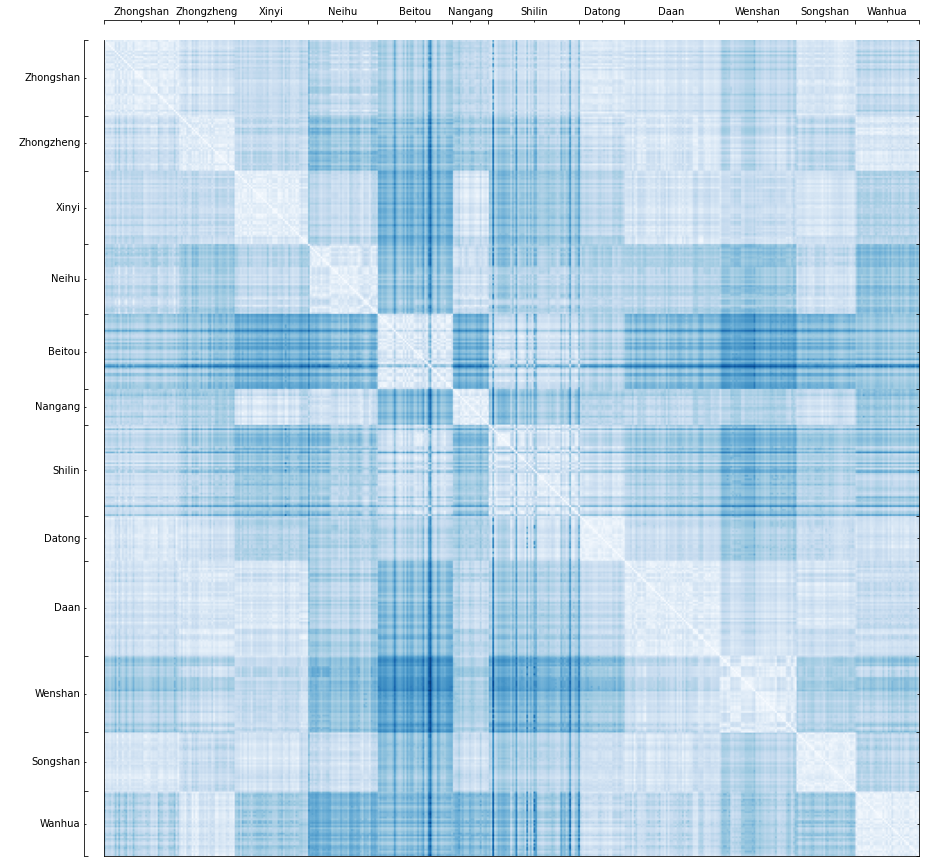

In [ ]:
from mpl_toolkits.axisartist import SubplotHost
from matplotlib import ticker
from google.colab import files
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15,15))

ax = SubplotHost(fig, 111)
fig.add_subplot(ax)

# ax = fig.add_subplot(111)
cax = ax.imshow(od_df, cmap='Blues');
# fig.colorbar(cax)
ax.set_xticks([])
ax.set_yticks([])
# ticks = np.arange(0,9,1)
# ax.set_xticks(ticks)
# ax.set_yticks(ticks)
# ax.set_xticklabels(names)
# ax.set_yticklabels(names)

# Add second axis
ax2 = ax.twiny()
offset = 0, 20 # Position of the second axis
new_axisline = ax2.get_grid_helper().new_fixed_axis
ax2.axis["top"] = new_axisline(loc="top", axes=ax2, offset=offset)
ax2.axis["bottom"].set_visible(False)

xticks = [0, 42, 73, 114, 153, 195, 215, 266, 291, 344, 387, 420, 456]
Locator = [21, 57.5, 93.5, 133.5, 174, 205, 240.5, 278.5, 317.5, 365.5, 403.5, 438]
Formatter = ['Zhongshan', 'Zhongzheng', 'Xinyi', 'Neihu', 'Beitou', 'Nangang', 'Shilin', 'Datong', 'Daan', 'Wenshan', 'Songshan', 'Wanhua']
ax2.set_xticks(xticks)
ax2.xaxis.set_major_formatter(ticker.NullFormatter())
ax2.xaxis.set_minor_locator(ticker.FixedLocator(Locator))
ax2.xaxis.set_minor_formatter(ticker.FixedFormatter(Formatter))

ax3 = ax.twinx()
offset = -20, 0 # Position of the second axis
new_axisline = ax2.get_grid_helper().new_fixed_axis
ax2.axis["left"] = new_axisline(loc="left", axes=ax3, offset=offset)
ax2.axis["right"].set_visible(False)

yticks = [0, 36, 69, 112, 165, 190, 241, 261, 303, 342, 383, 414, 456]
Locator = [18, 52.5, 90.5, 138.5, 177.5, 215.5, 251, 282, 322.5, 362.5, 398.5, 435]
Formatter = ['Wanhua', 'Songshan', 'Wenshan', 'Daan', 'Datong', 'Shilin', 'Nangang', 'Beitou', 'Neihu', 'Xinyi', 'Zhongzheng', 'Zhongshan']
ax3.set_yticks(yticks)
ax3.yaxis.set_major_formatter(ticker.NullFormatter())
ax3.yaxis.set_minor_locator(ticker.FixedLocator(Locator))
ax3.yaxis.set_minor_formatter(ticker.FixedFormatter(Formatter))

plt.show()

## Check Routes on map

In [ ]:
# Subtract route shape from string to list of coordinates 
for j in range(len(travel_df)):
  route = ast.literal_eval(travel_df['shape'][j])
  route_1 = []
  for i in range(len(route)):
    route_1.append(eval(route[i]))
  travel_df['shape'][j] = route_1
  
route_df = travel_df[['origin', 'destination', 'shape']]
route_df

,origin,destination,shape
0,中山區下埤里,中山區下埤里,"[(25.0668204, 121.5416919), (25.0668204, 121.5..."
1,中山區下埤里,中山區中原里,"[(25.0668204, 121.5416919), (25.0668204, 121.5..."
2,中山區下埤里,中山區中吉里,"[(25.0668204, 121.5416919), (25.0668204, 121.5..."
3,中山區下埤里,中山區中央里,"[(25.0668204, 121.5416919), (25.0668204, 121.5..."
4,中山區下埤里,中山區中山里,"[(25.0668204, 121.5416919), (25.0668204, 121.5..."
...,...,...,...
207931,萬華區騰雲里,萬華區錦德里,"[(25.0243056, 121.5089348), (25.0247419, 121.5..."
207932,萬華區騰雲里,萬華區雙園里,"[(25.0243056, 121.5089348), (25.0247419, 121.5..."
207933,萬華區騰雲里,萬華區青山里,"[(25.0243056, 121.5089348), (25.0247419, 121.5..."
207934,萬華區騰雲里,萬華區頂碩里,"[(25.0243056, 121.5089348), (25.0247419, 121.5..."


In [ ]:
def neighborhood_routes(neigh, route_color):
  route_single = route_df[route_df['origin'] == neigh]
  route_single.reset_index(drop=True, inplace=True)

  for i in range(len(route_single)):
    folium.PolyLine(route_single['shape'][i],
                    color=route_color,
                    weight=1,
                    opacity=0.8).add_to(map)

  paragraph = """<p>{}</p>""".format
  iframe = IFrame(html = paragraph(utf2asc(neigh)),
              width=100,
              height=50)
  popup = folium.Popup(iframe)
  folium.Marker(
      [route_single['shape'][0][0][0], route_single['shape'][0][0][1]],
      popup = popup
      ).add_to(map) 

  return map

In [ ]:
# the shortest path may take routes outside researched region 
map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)
neighborhood_routes('中山區中央里', 'magenta')
add_office()

In [ ]:
# the shortest path may not be the one that connects two neighboring nodes directly 
map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)
neighborhood_routes('士林區溪山里', 'brown')
add_office()

In [ ]:
# the shortest path may take routes outside researched region 
map = folium.Map(location=[latitude, longitude], tiles='cartodbpositron', zoom_start=12)
neighborhood_routes('萬華區華中里', 'green')
add_office()